Name: Gokulakrishnan B

Roll No: DA24M007

Assignment no: 9

In [1]:
import kagglehub

# Download latest version
kagglehub.dataset_download("ravicmiisi/visual-taxonomy")



100%|██████████| 3.52G/3.52G [00:56<00:00, 66.3MB/s]

Extracting files...


'/root/.cache/kagglehub/datasets/ravicmiisi/visual-taxonomy/versions/1'

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
!cp -r /root/.cache/kagglehub/datasets/ravicmiisi/visual-taxonomy/versions/1/ /content/

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [5]:
df = pd.read_csv('/content/1/train.csv')

In [6]:
df.head()

,id,Category,len,attr_1,attr_2,attr_3,attr_4,attr_5,attr_6,attr_7,attr_8,attr_9,attr_10
0,0,Men Tshirts,5,default,round,printed,default,short sleeves,NaN,NaN,NaN,NaN,NaN
1,1,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
2,2,Men Tshirts,5,default,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
3,3,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
4,4,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN


In [7]:
# we will consider attribute 1 and 3

print('Value counts of attribute 1 ')
print(df['attr_1'].value_counts())
print('-------------------------------')
print('Value counts of attribute 3 ')
print(df['attr_3'].value_counts())

Value counts of attribute 1 
attr_1
default           9268
white             8402
black             7901
same as saree     5230
multicolor        4076
pink              3132
yellow            3112
maroon            2597
red               2178
same as border    1611
blue              1371
navy blue         1140
green              924
peach              397
solid              188
purple             170
grey               137
orange              33
Name: count, dtype: int64
-------------------------------
Value counts of attribute 3 
attr_3
regular         15546
crop            12418
small border     9520
big border       5781
solid            3185
printed          2606
knee length      2048
long             1682
calf length      1352
no border         560
Name: count, dtype: int64


We will pick `black` from attribute 1
and `crop` from attribute 3

In [8]:
# create baskets (dictionary of lenght 10 (category,attribute) pairs as key and image ids will be stored in its value)

baskets = {}


In [9]:
for cat in df['Category'].unique():
    cnt = df[(df['attr_1'] == 'black') & (df['Category'] == cat)].shape[0]
    print(f'{cat} has {cnt} rows with attr_1 as black')

Men Tshirts has 804 rows with attr_1 as black
Sarees has 0 rows with attr_1 as black
Kurtis has 1395 rows with attr_1 as black
Women Tshirts has 2999 rows with attr_1 as black
Women Tops & Tunics has 2703 rows with attr_1 as black


Except for sarees, we will use attr_1 as `black`. For sarees, we will use `same as saree` as attr_1 value

In [10]:
for cat in df['Category'].unique():
    cnt = df[(df['attr_3'] == 'knee length') & (df['Category'] == cat)].shape[0]
    print(f'{cat} has {cnt} rows with attr_3 as crop')

Men Tshirts has 0 rows with attr_3 as crop
Sarees has 0 rows with attr_3 as crop
Kurtis has 2048 rows with attr_3 as crop
Women Tshirts has 0 rows with attr_3 as crop
Women Tops & Tunics has 0 rows with attr_3 as crop


For attr_3,
 - men - solid
 - saree - small border
 - kurti - knee length
 - women t shirt - crop
 - women tops - crop

In [11]:
# Appending 100 image ids in each basket

baskets['Men Tshirts_attr_1'] = df[(df['Category'] == 'Men Tshirts') & (df['attr_1'] == 'black' )]['id'].sample(n=100, random_state =1).to_list()
baskets['Men Tshirts_attr_3'] = df[(df['Category'] == 'Men Tshirts') & (df['attr_3'] == 'solid' )]['id'].sample(n=100, random_state =1).to_list()

baskets['Sarees_attr_1'] = df[(df['Category'] == 'Sarees') & (df['attr_1'] == 'same as saree' )]['id'].sample(n=100, random_state =1).to_list()
baskets['Sarees_attr_3'] = df[(df['Category'] == 'Sarees') & (df['attr_3'] == 'small border' )]['id'].sample(n=100, random_state =1).to_list()

baskets['Kurtis_attr_1'] = df[(df['Category'] == 'Kurtis') & (df['attr_1'] == 'black' )]['id'].sample(n=100, random_state =1).to_list()
baskets['Kurtis_attr_3'] = df[(df['Category'] == 'Kurtis') & (df['attr_3'] == 'knee length' )]['id'].sample(n=100, random_state =1).to_list()

baskets['Women Tshirts_attr_1'] = df[(df['Category'] == 'Women Tshirts') & (df['attr_1'] == 'black' )]['id'].sample(n=100, random_state =1).to_list()
baskets['Women Tshirts_attr_3'] = df[(df['Category'] == 'Women Tshirts') & (df['attr_3'] == 'crop' )]['id'].sample(n=100, random_state =1).to_list()

baskets['Women Tops & Tunics_attr_1'] = df[(df['Category'] == 'Women Tops & Tunics') & (df['attr_1'] == 'black' )]['id'].sample(n=100, random_state =1).to_list()
baskets['Women Tops & Tunics_attr_3'] = df[(df['Category'] == 'Women Tops & Tunics') & (df['attr_3'] == 'crop' )]['id'].sample(n=100, random_state =1).to_list()

In [12]:
total_cnt = 0
for b in baskets:
    total_cnt += len(baskets[b])

print(f'Total number of ids in baskets is {total_cnt}')

Total number of ids in baskets is 1000


In [13]:
for b in baskets:
    baskets[b][:] = [str(x).zfill(6) for x in baskets[b]]

In [14]:
from PIL import Image
from sklearn.manifold import Isomap

In [15]:
from matplotlib import offsetbox

def plot_components(proj, images=None, ax=None,
                    thumb_frac=0.05, cmap='gray', image_size=0.1):
    ax = ax or plt.gca()

    ax.plot(proj[:, 0], proj[:, 1], '.k')

    if images is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 2
        shown_images = np.array([2 * proj.max(0)])
        for i in range(len(images)):
            dist = np.sum((proj[i] - shown_images) ** 2, 1)
            if np.min(dist) < min_dist_2:
                continue
            shown_images = np.vstack([shown_images, proj[i]])

            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(images[i], zoom=image_size, cmap=cmap),
                proj[i]
            )
            ax.add_artist(imagebox)

# Isomap

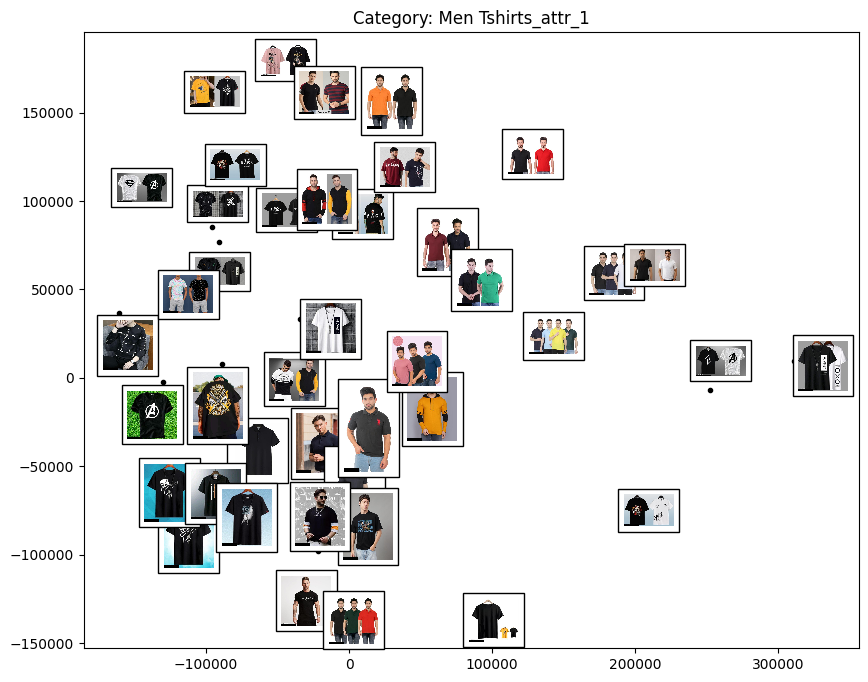

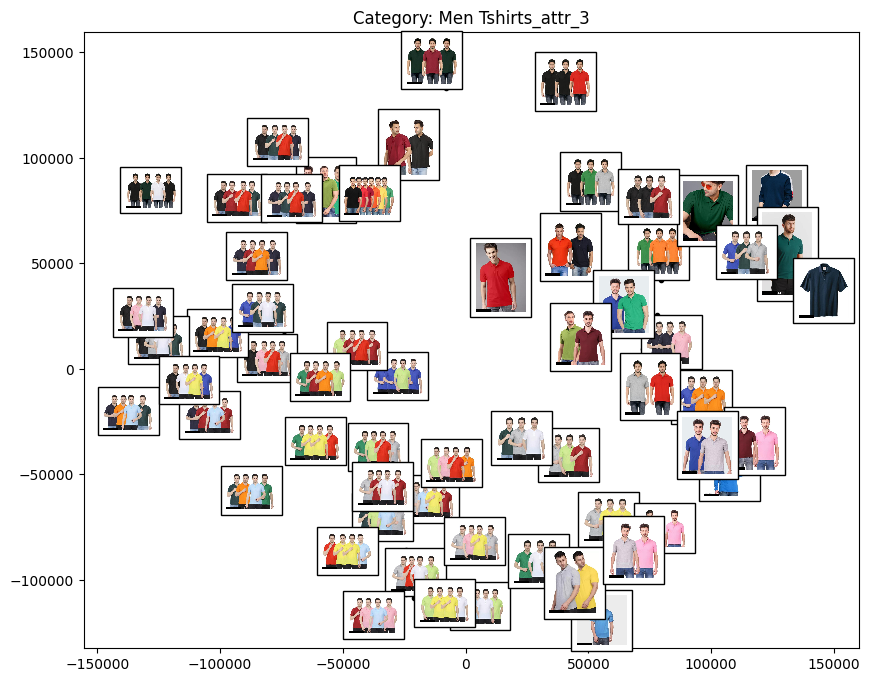

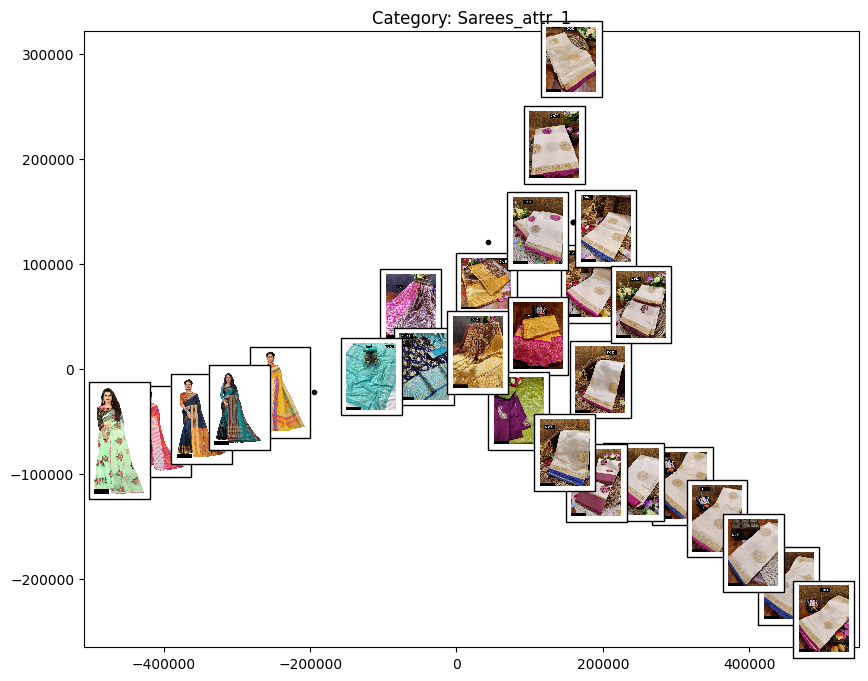

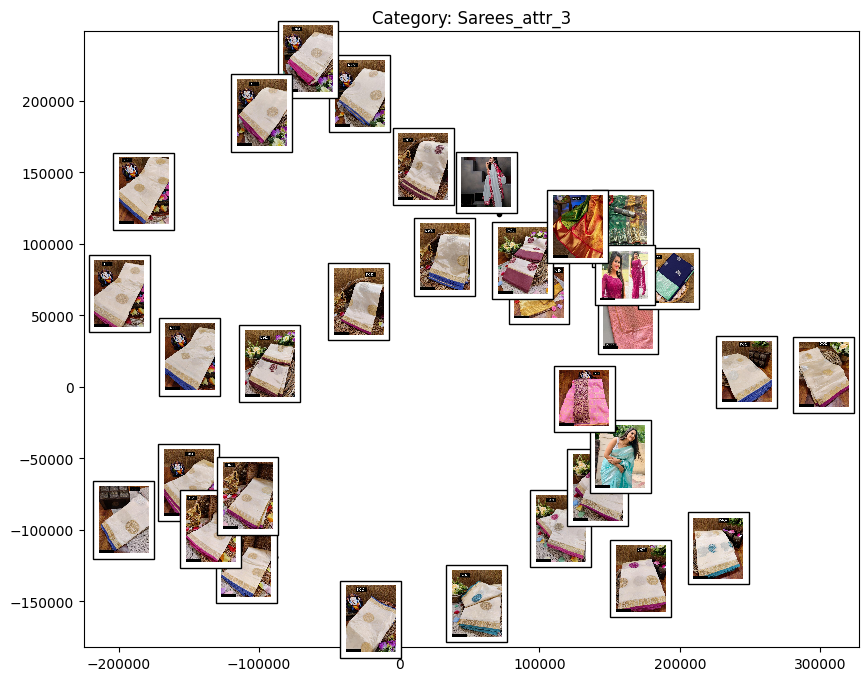

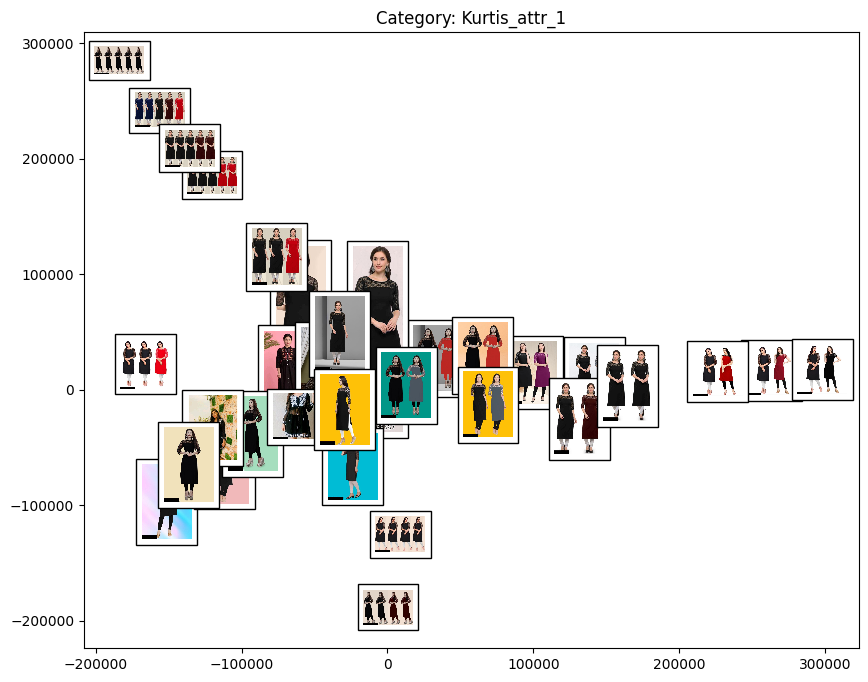

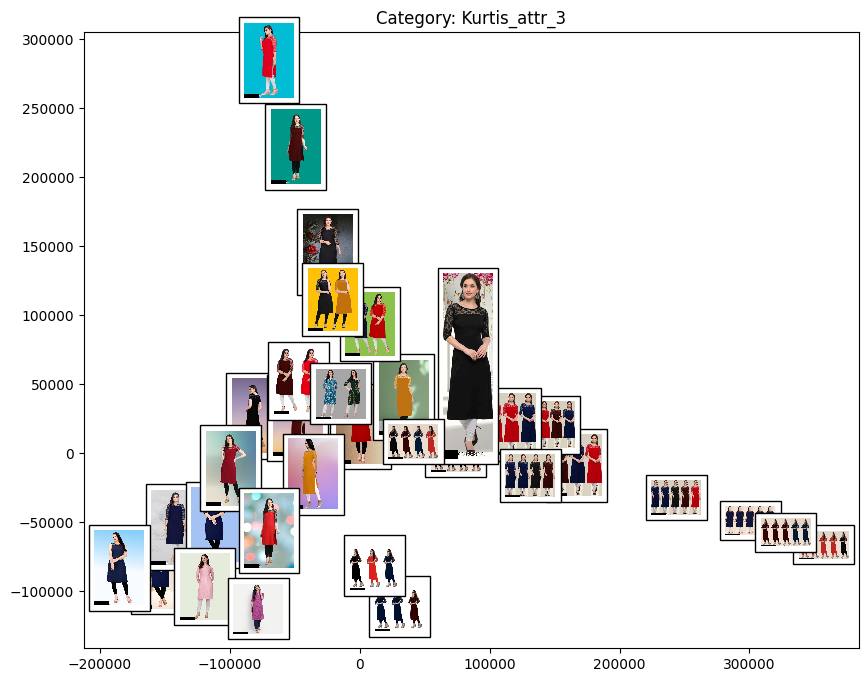

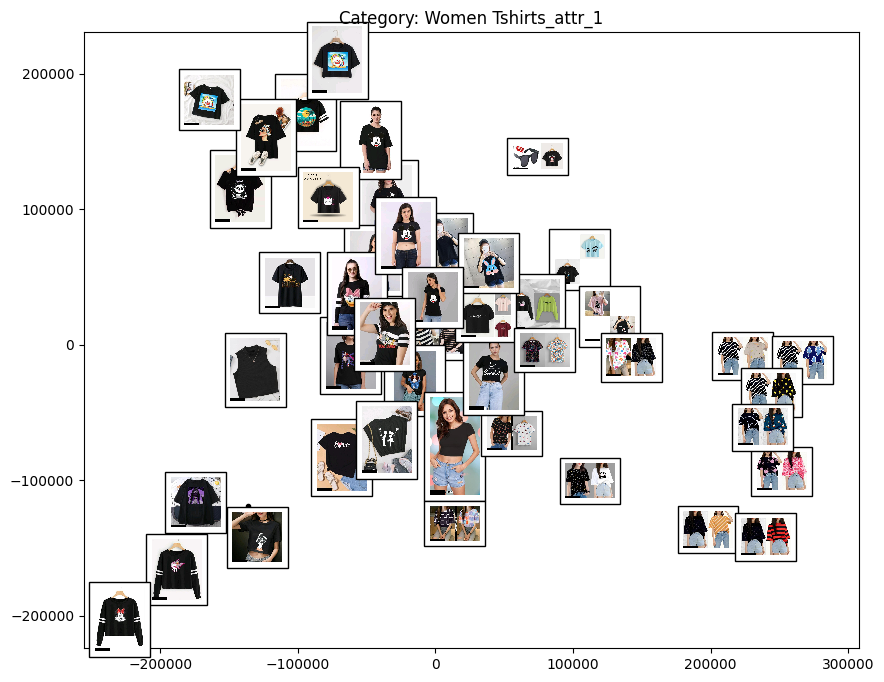

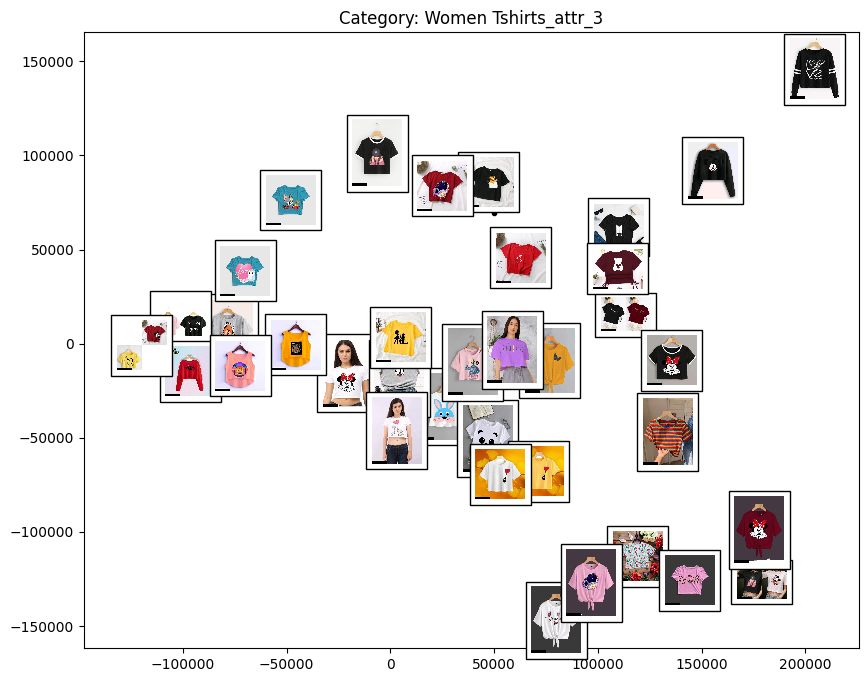

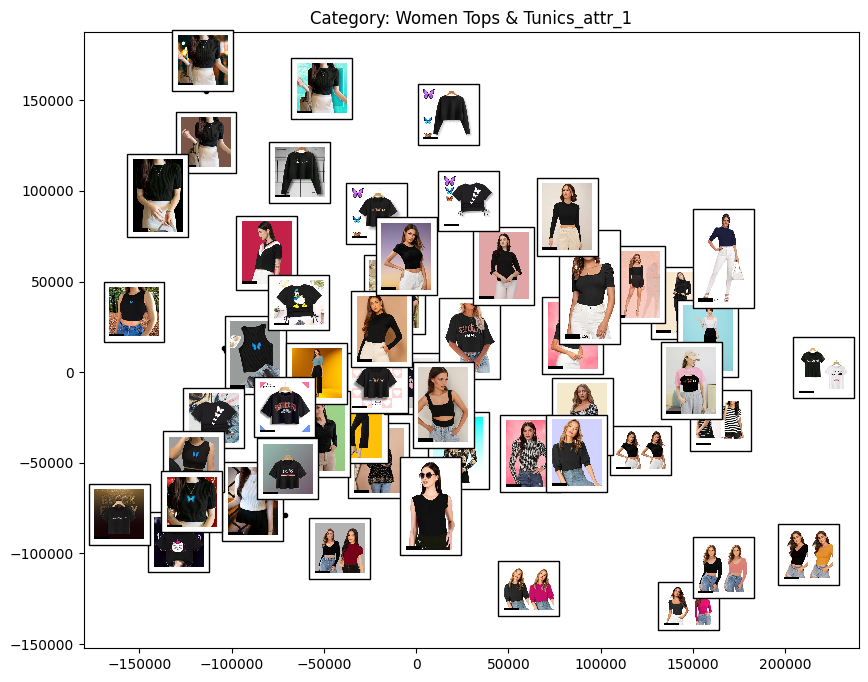

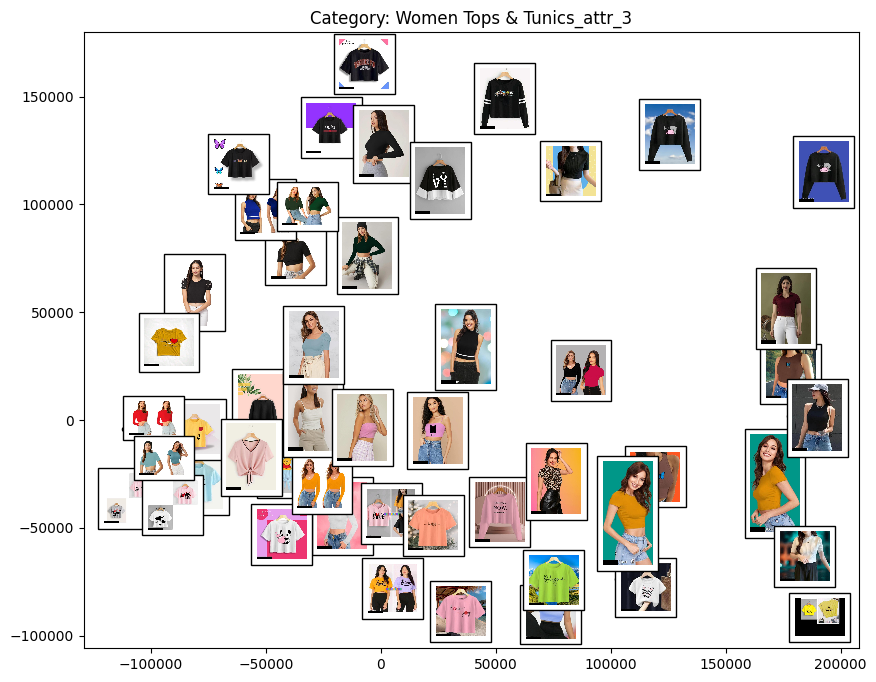

In [16]:
target_size = (476, 512)

for category in baskets:
    image_ids = baskets[category]

    images = []
    actual_images = []

    for id in image_ids:

        image = Image.open(f'/content/1/train_images/{id}.jpg')
        actual_images.append(image)

        if image.size != target_size:
            image = image.resize(target_size)

        image_arr = np.array(image).flatten()
        images.append(image_arr)

    images = np.array(images)

    isomap = Isomap(n_components=2)
    embeddings = isomap.fit_transform(images)

    plt.figure(figsize=(10, 8))
    plt.title(f"Category: {category}")
    plot_components(embeddings, actual_images, image_size=0.07)

    plt.show()
    print()

# tSNE

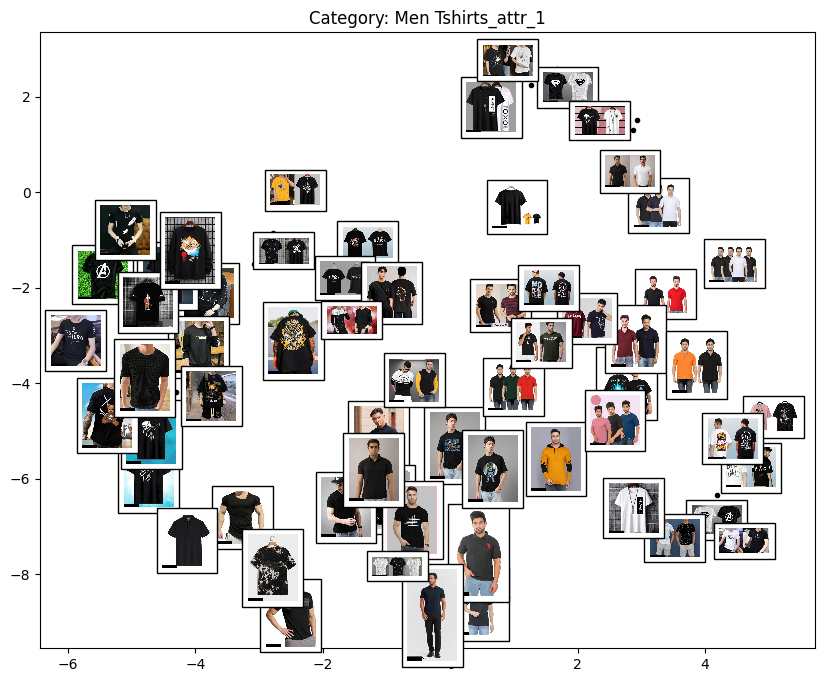

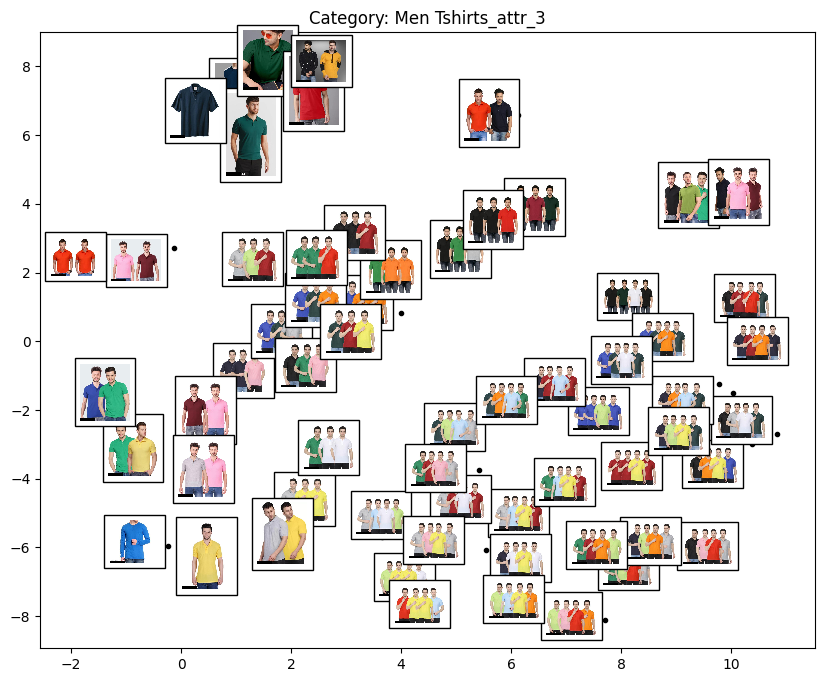

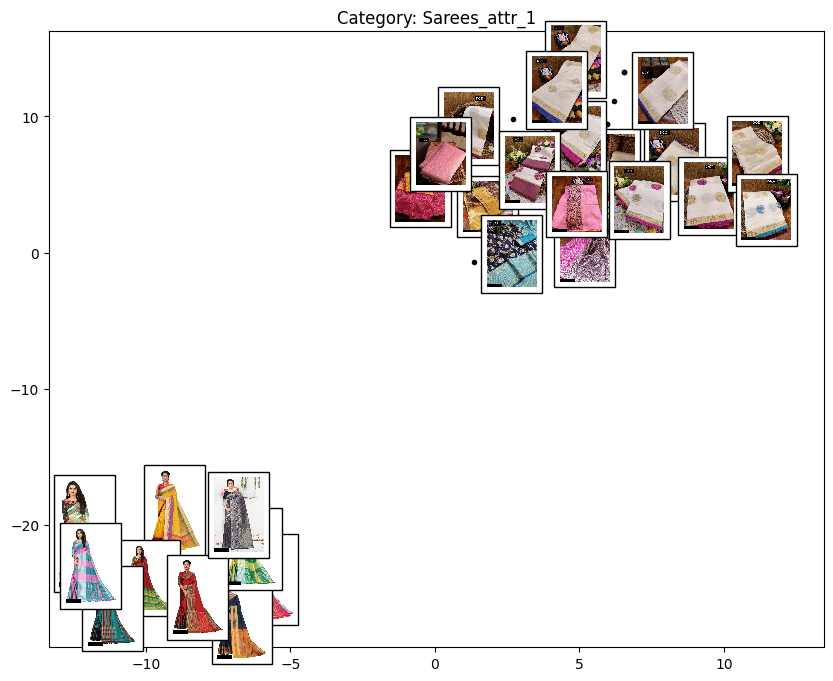

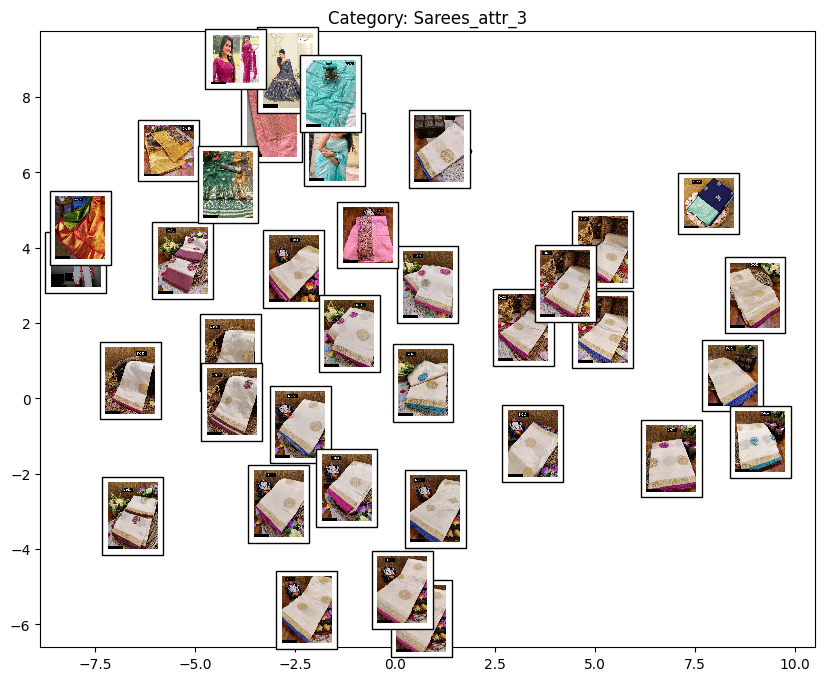

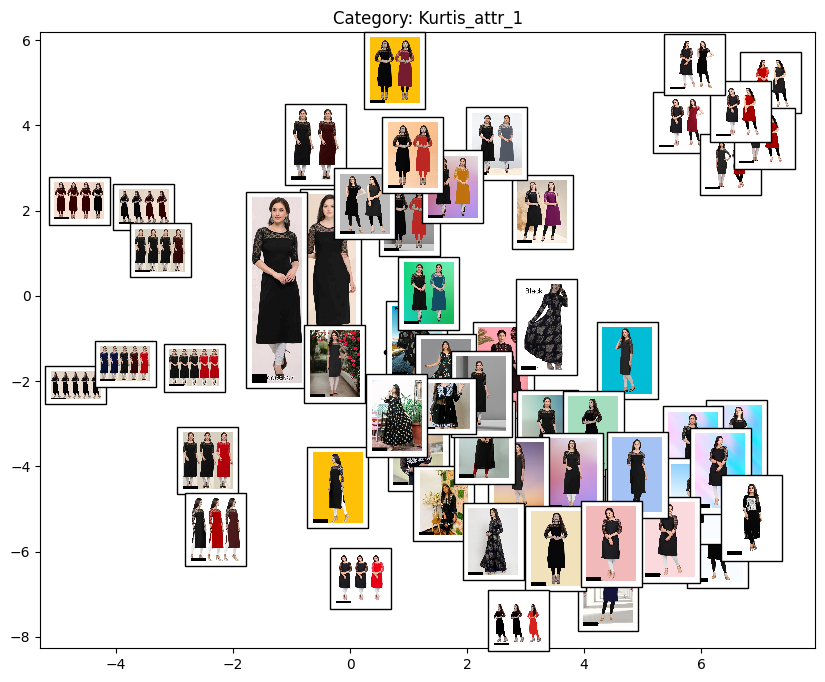

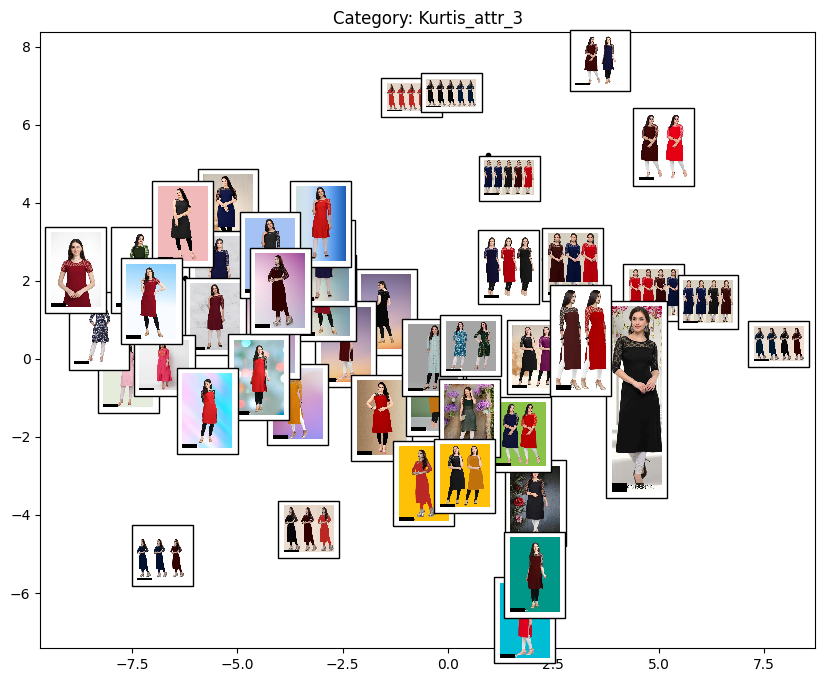

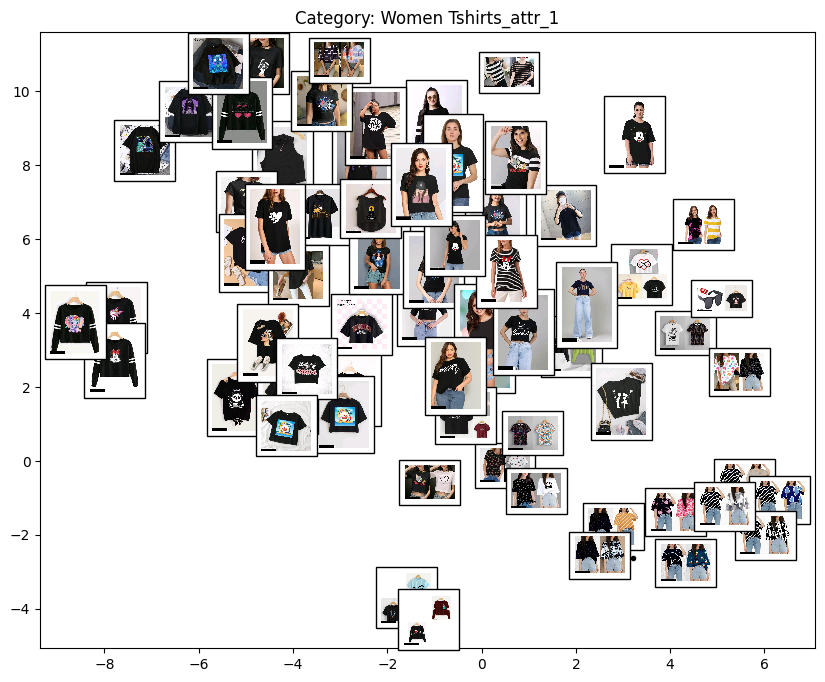

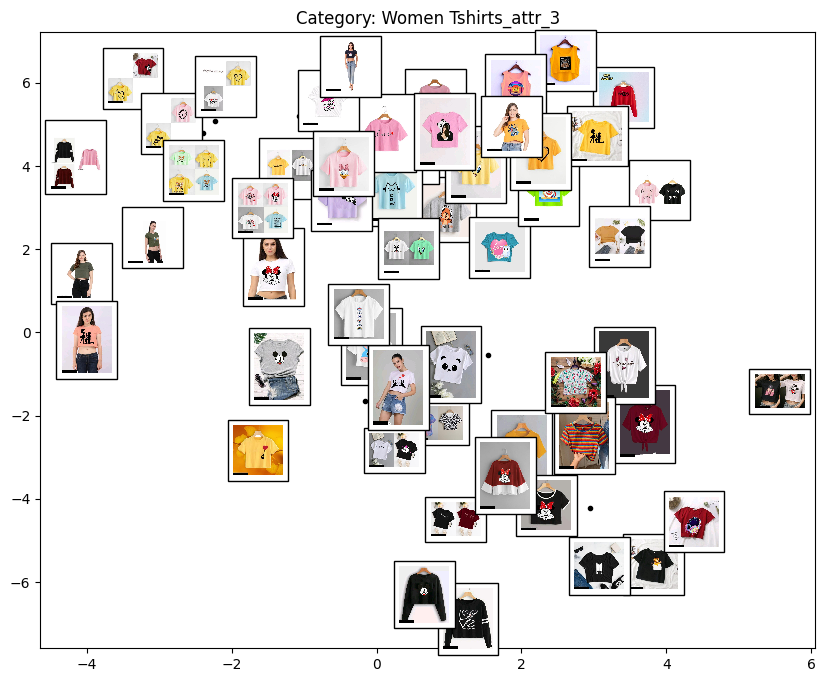

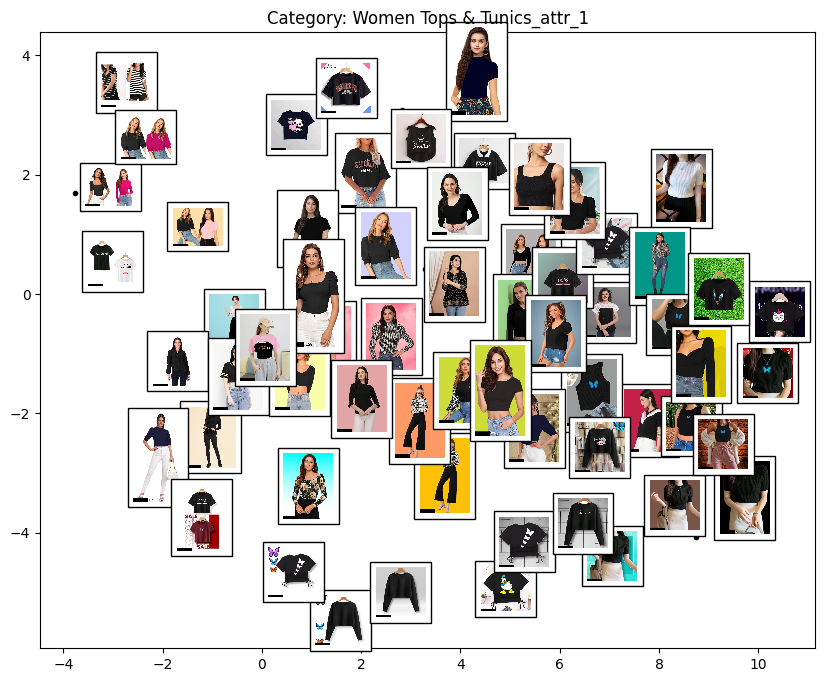

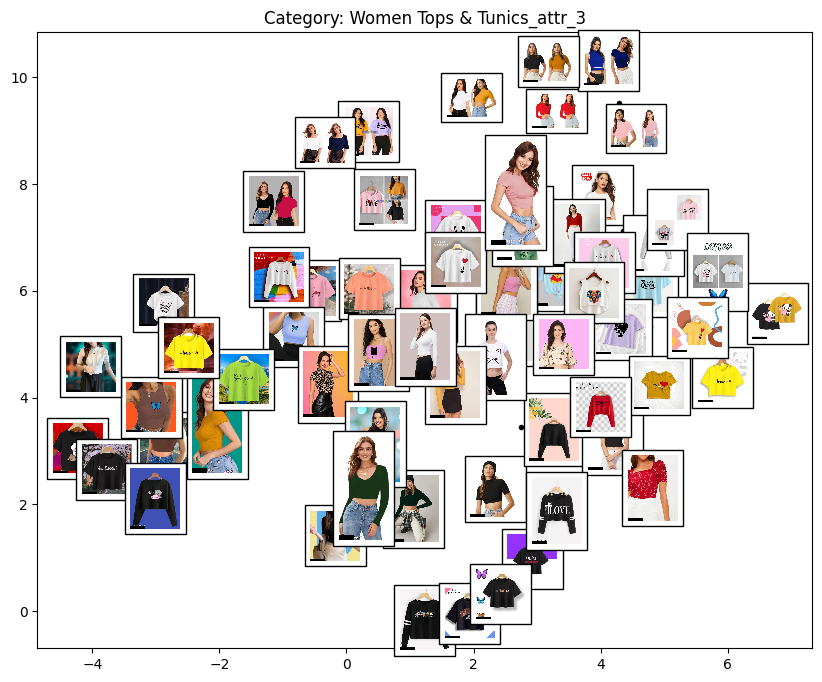

In [17]:
from sklearn.manifold import TSNE


target_size = (476, 512)

for category in baskets:
    image_ids = baskets[category]

    images = []
    actual_images = []

    for id in image_ids:

        image = Image.open(f'/content/1/train_images/{id}.jpg')
        actual_images.append(image)

        if image.size != target_size:
            image = image.resize(target_size)

        image_arr = np.array(image).flatten()
        images.append(image_arr)

    images = np.array(images)

    tsne = TSNE(n_components=2, random_state=42)
    embeddings = tsne.fit_transform(images)

    plt.figure(figsize=(10, 8))
    plt.title(f"Category: {category}")
    plot_components(embeddings, actual_images, image_size=0.07)

    plt.show()
    print()

# Task 3 - Inferring from the images from Isomap

## 1. Men's Tshirt with black color

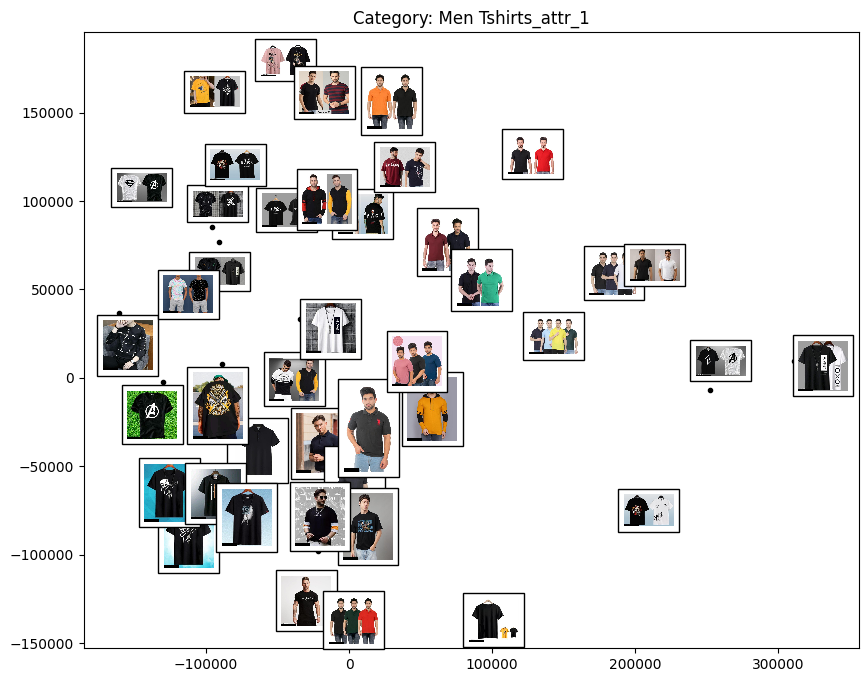

I am not able to infer any pattern from the above image

## 2. Men's Tshirt with solid pattern

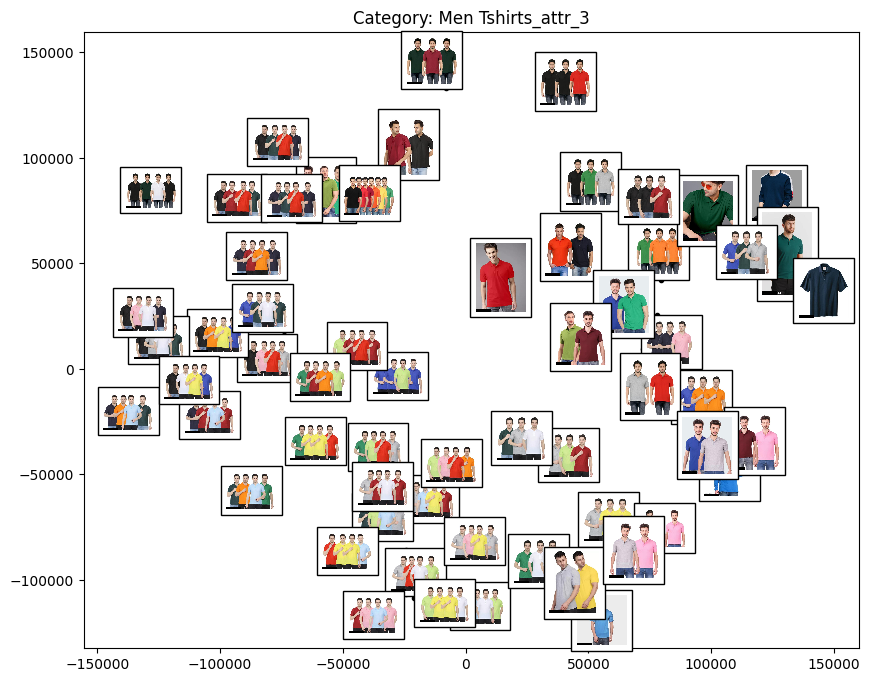

Observations:
- in bottom, dresses are light, at top, dresses are dark. So as we move along bottom to top, color starts to get dark.
- At left, image contains group of people, as we move towards right, the number of people in the image decreases.

## 3. Saree with the color of `same as saree`

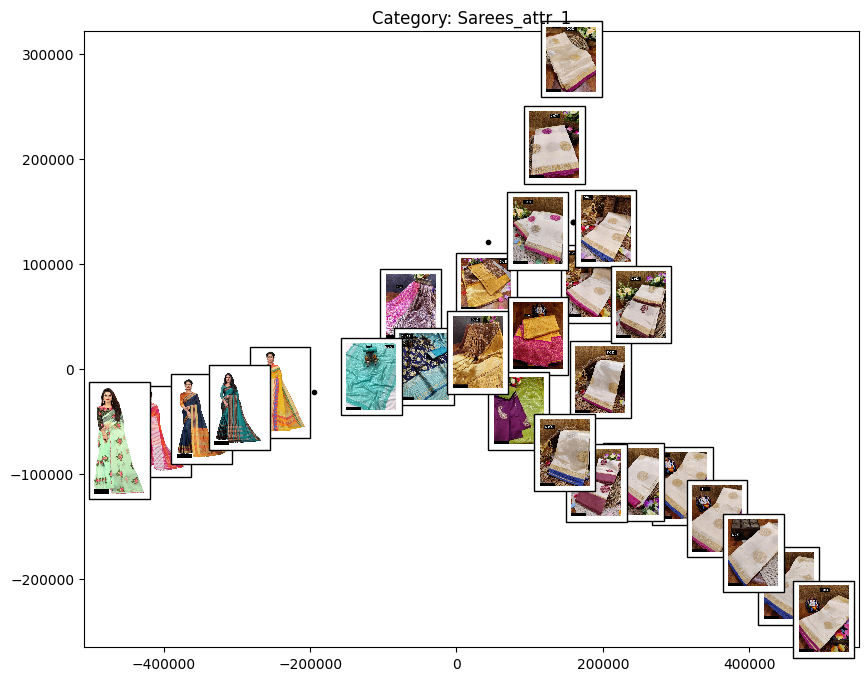

Observations:
- In left, images are more colorful, in right, we only have white colored saree. Thus on moving from left to right, the sarees become white.
- I could not infer anything along the vertical axis.

## 4. Saree with small border

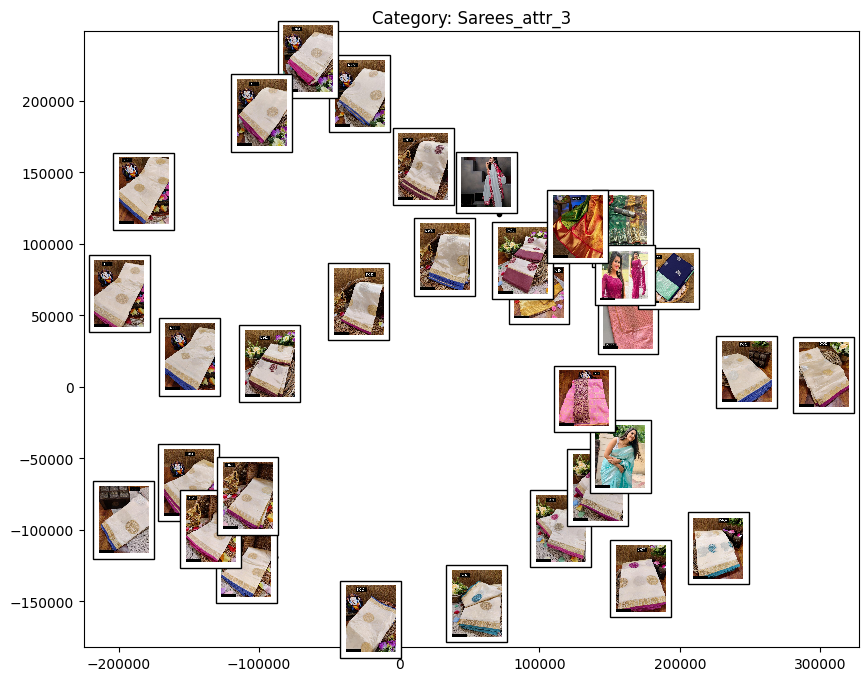

I could not infer anything from the above image

## 5. Kurtis with black color

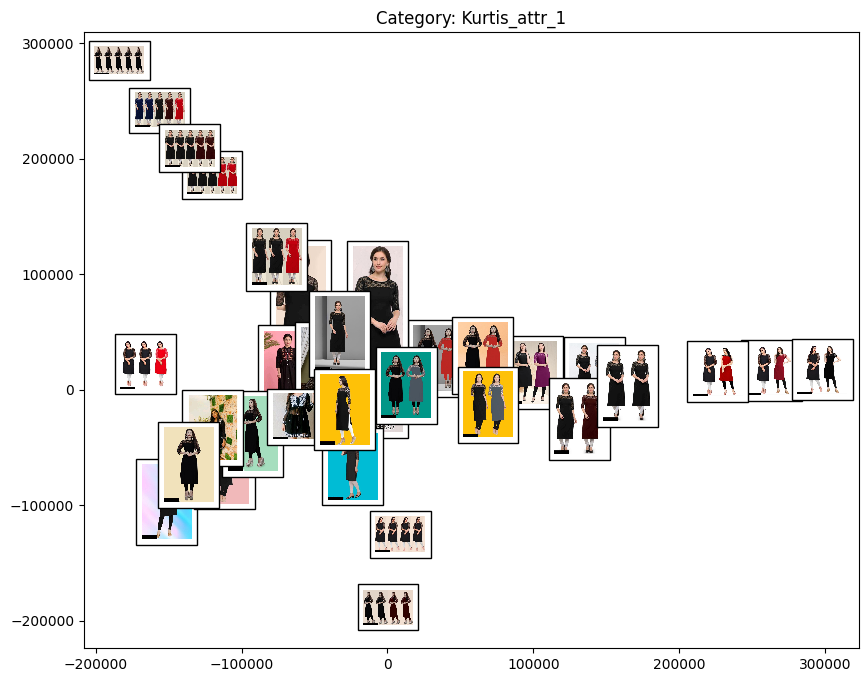

## 6. Kurti's with knee length

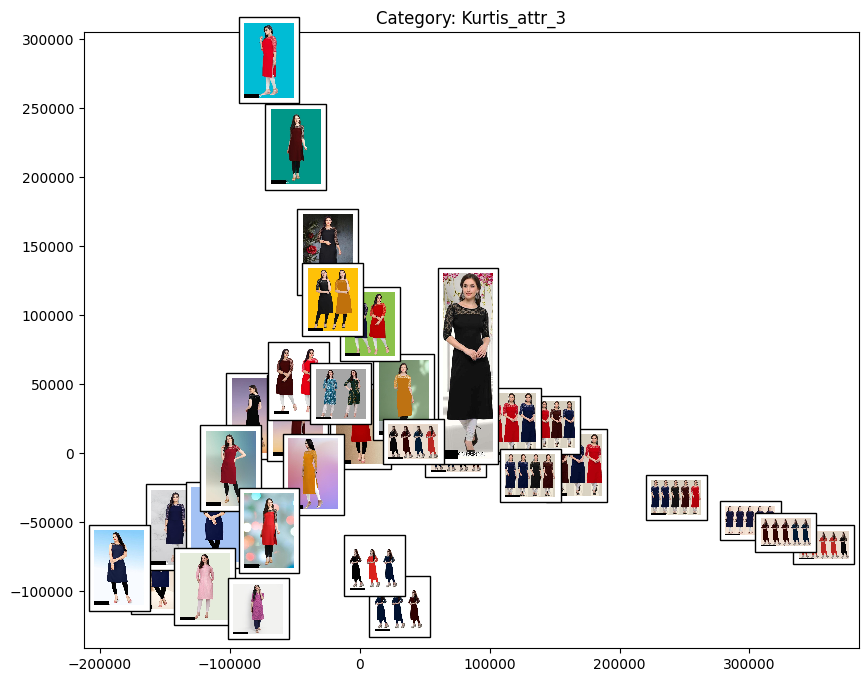

observations:
- From left to right, number of people in the image increases.
- From top to bottom, the background of image becomes lighter.


## 7. Womes's Tshirt with black color

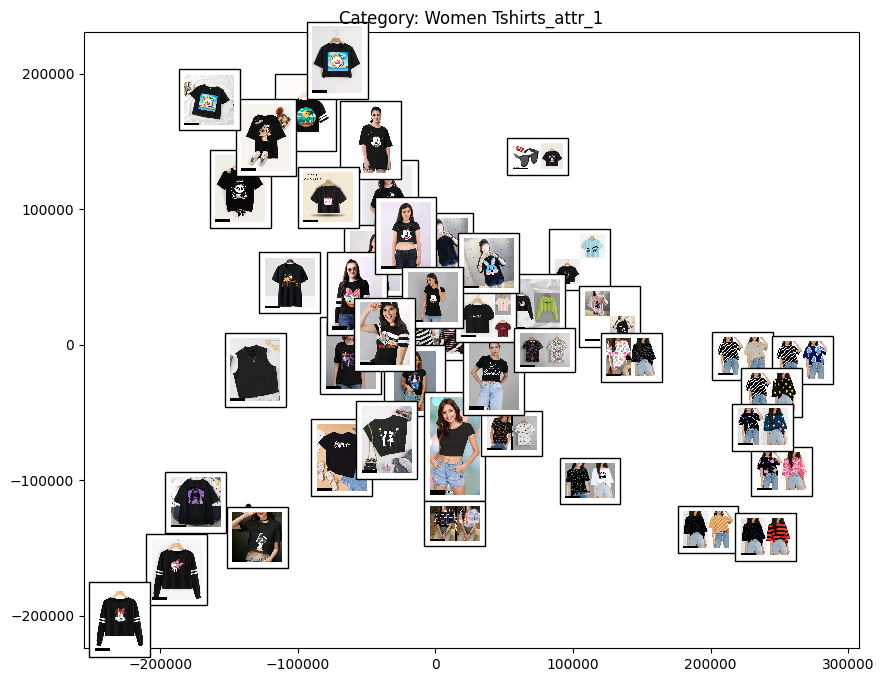

Observations:
- From left to right, the number of clothes in the image decreases.
- I couldn't infer any pattern in the vertical axis.

## 8. Women's Tshirt with crop type

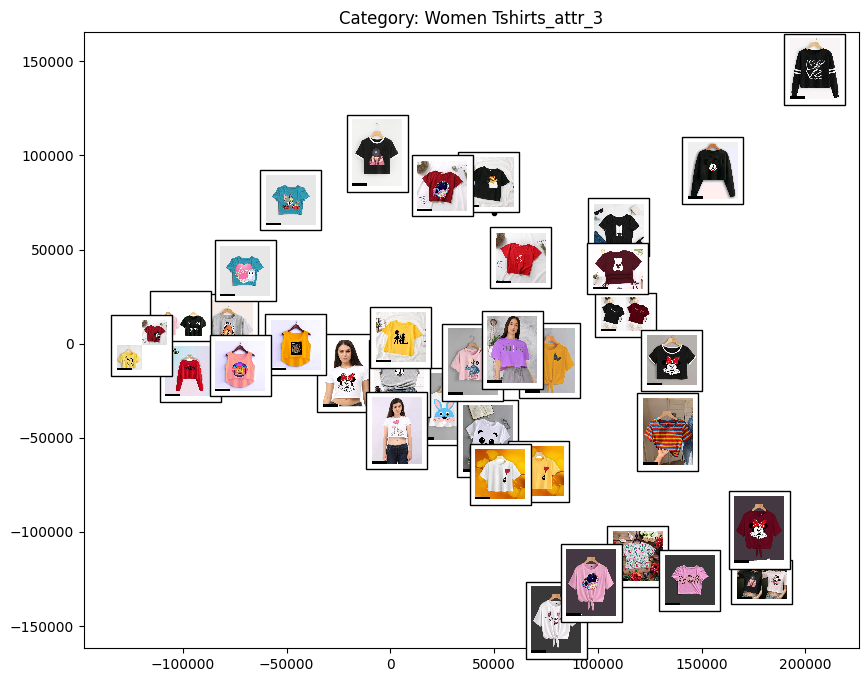

Observations:
- From left to right, the color of clothes in the image gets darker.
- From top to bottom , the background color of clothes in the image gets darker.

## 9. Women's tops with black color

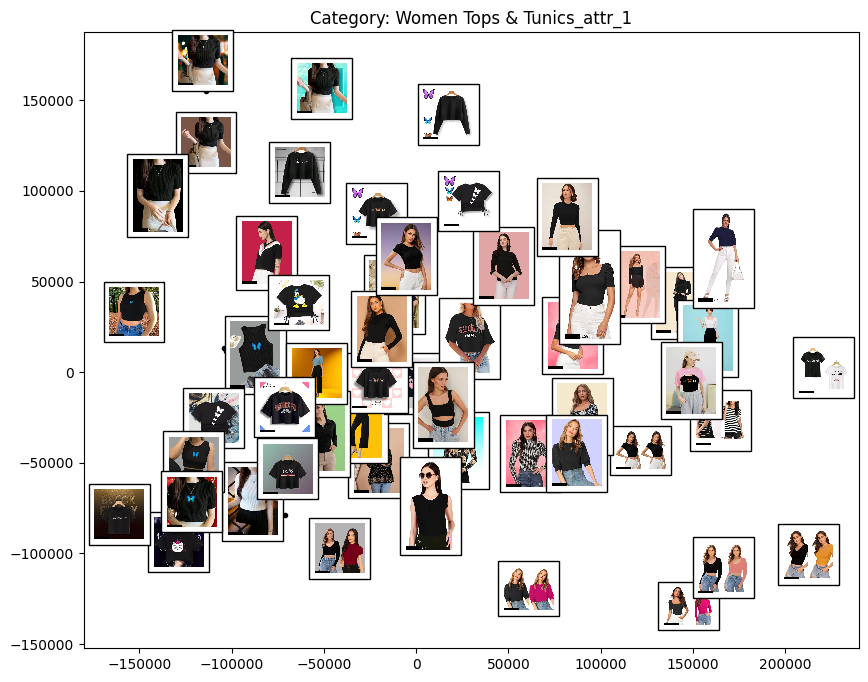

Observations:
- From left to right, the color of background of clothes in the images gets darker.
- I couldn't find any pattern along the vertical axis.

## 10. Women's top with crop fit

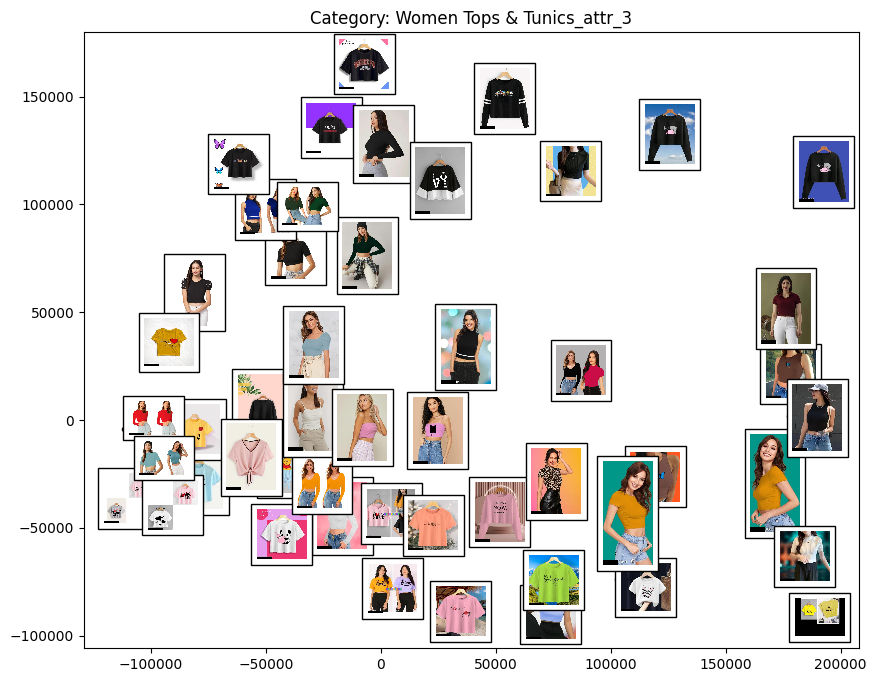

Observations:
- Clothes in the top are darker than the clothes in the bottom.
- The number of people/clothes in the left side is more than that of right side.

# Task 3 - Observations from tSNE compression

## 1. Men's Tshirt with black color

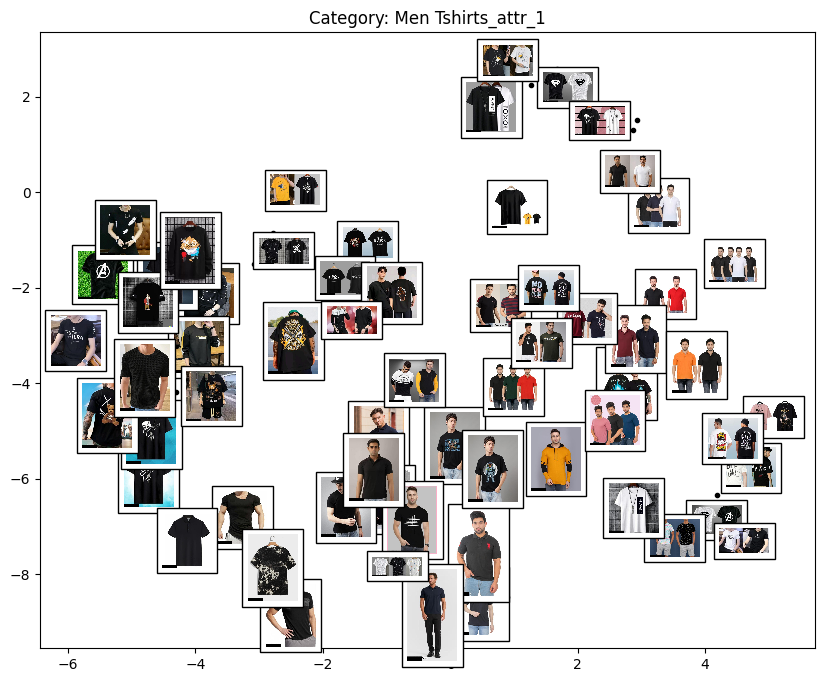

Observations:
- The number of clothes increases from left to right. Also the clothes becomes lighter on moving right.
- I couldn't find any pattern in vertical axis.

## 2. Men's Tshirt with solid pattern

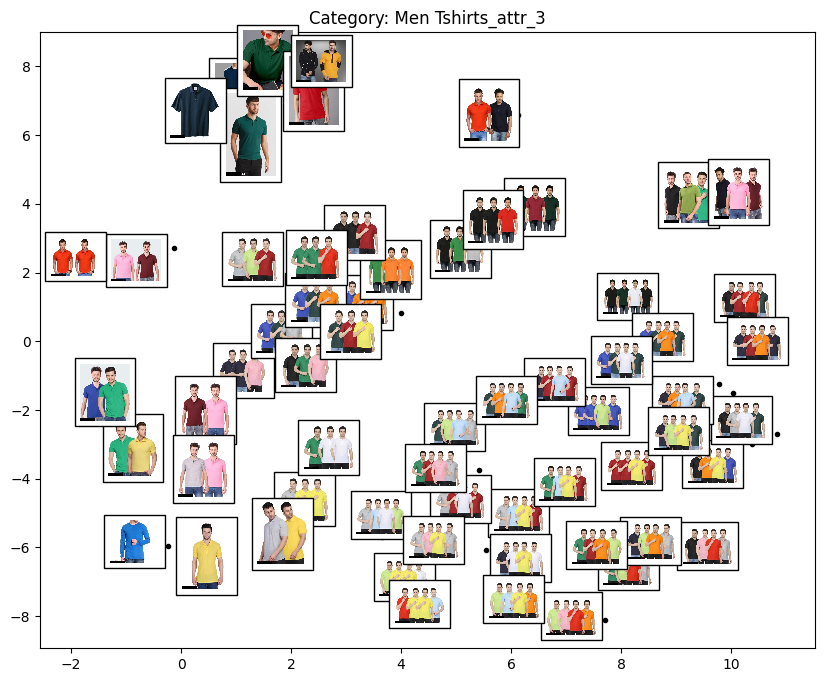


Observations:
- The number of clothes increases from left to right.
- The clothes become lighter when moving from top to bottom.

## 3. Saree with `same as saree` color

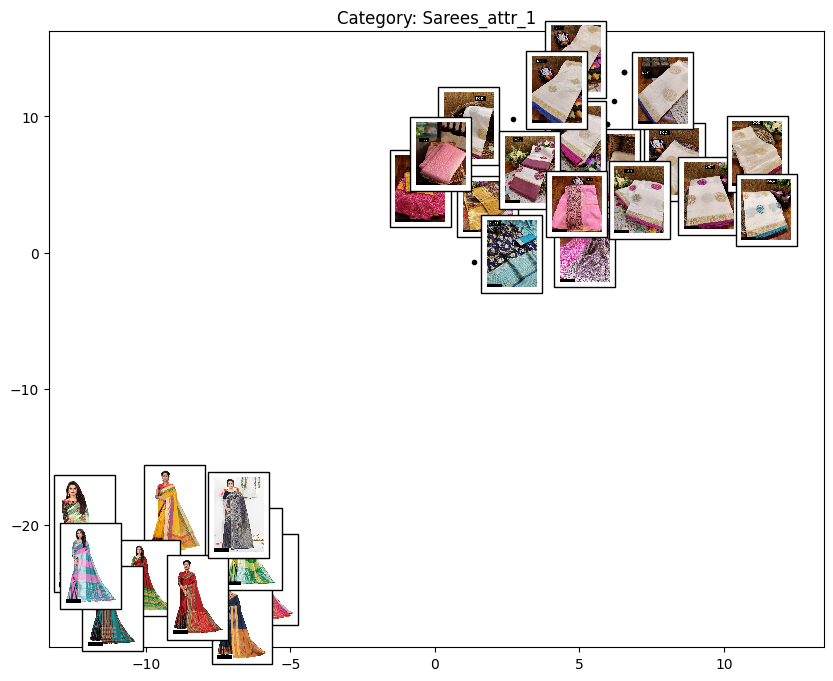

Observation:
- here we got 2 clusters, one  with only sarees, and one with person wearing the sarees

## 4. Saree with small border

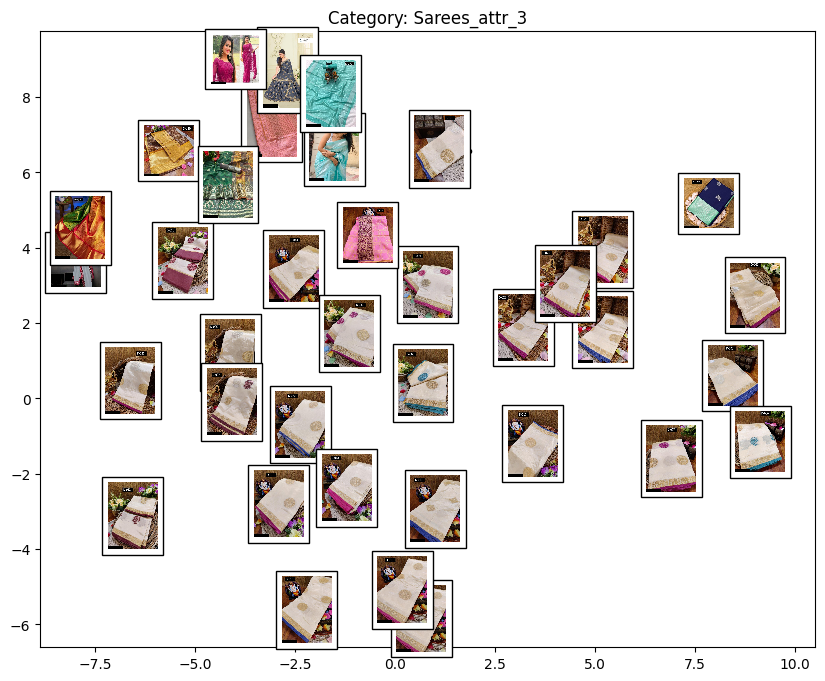

Observations:
- on moving from top to bottom, the clothes become white in
color.
- I couldn't find any pattern in horizontal axis.

## 5. Kurti's with black color

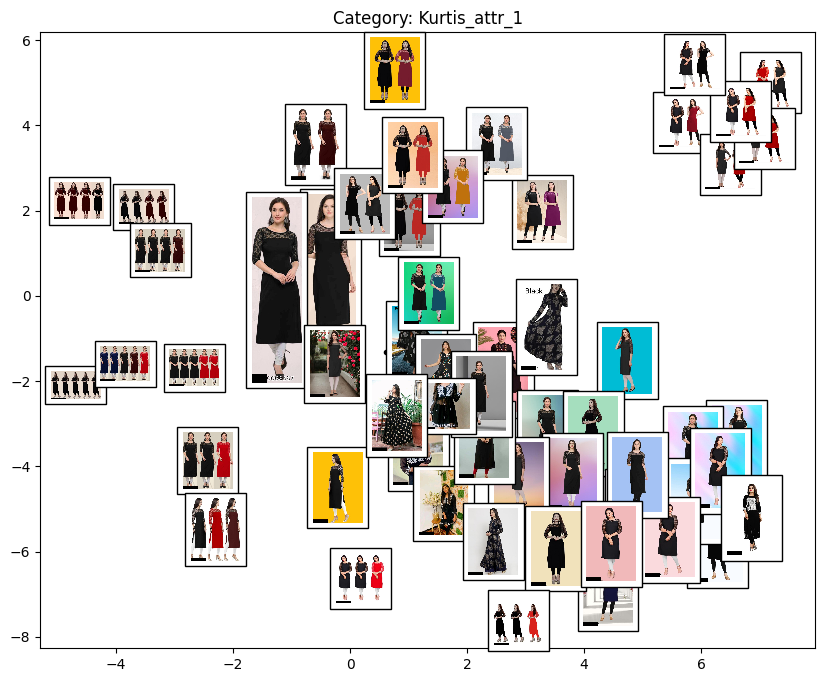

Observations:
- From left to right, the number of people/clothes decreases.
- I couldnt find any pattern in vertical axis

## 6. Kurti's with knee length

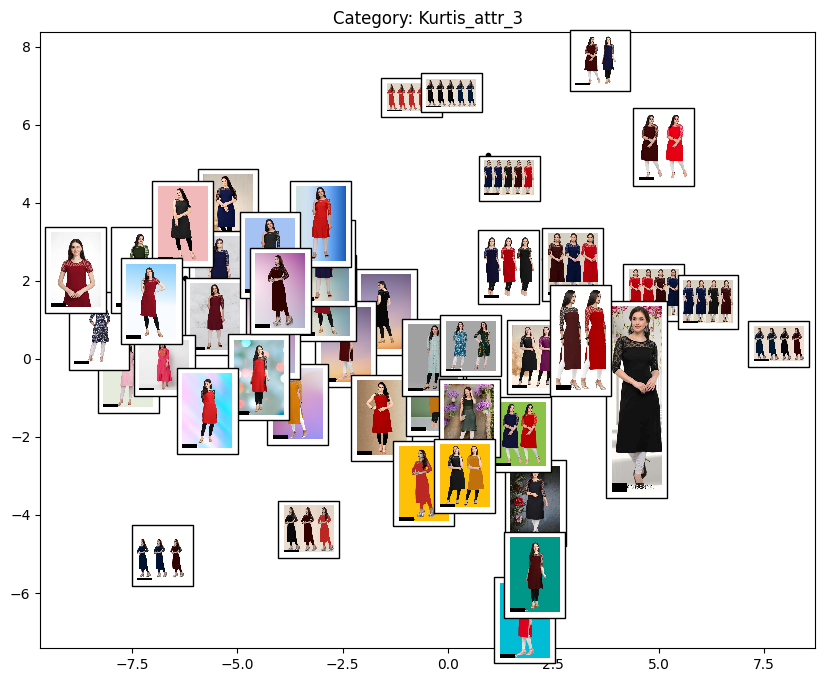

Observations:
- From left to right, the number of people/clothes increases.
- From top to bottom, the darkness in the cloth background increases.

## 7. Women's Tshirt with black color.

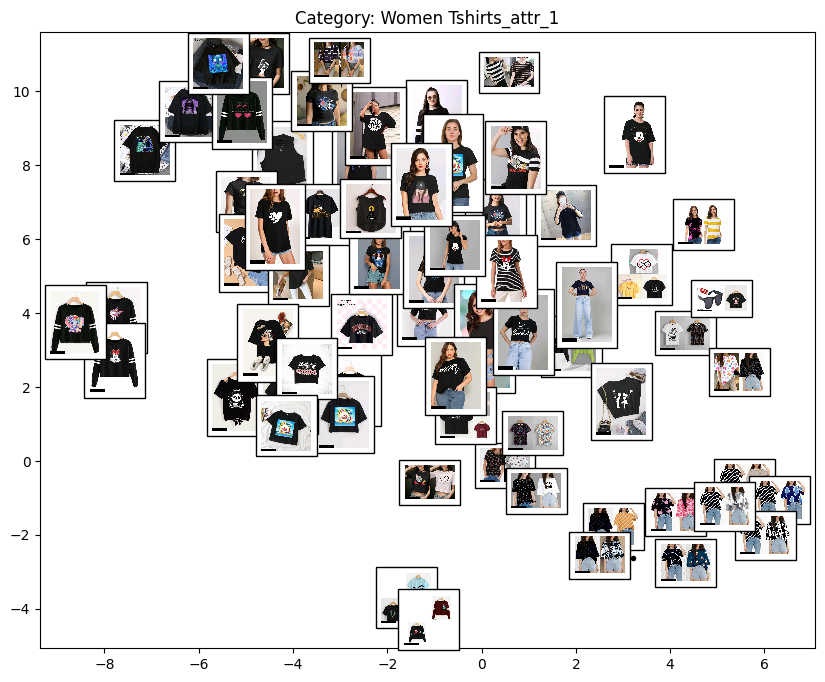

Observations:
- From top to bottom, the number of clothes in an image increases.
- From left to right, the pattern in the cloth (like design work) increases.

## 8. Women's Tshirt with crop pattern

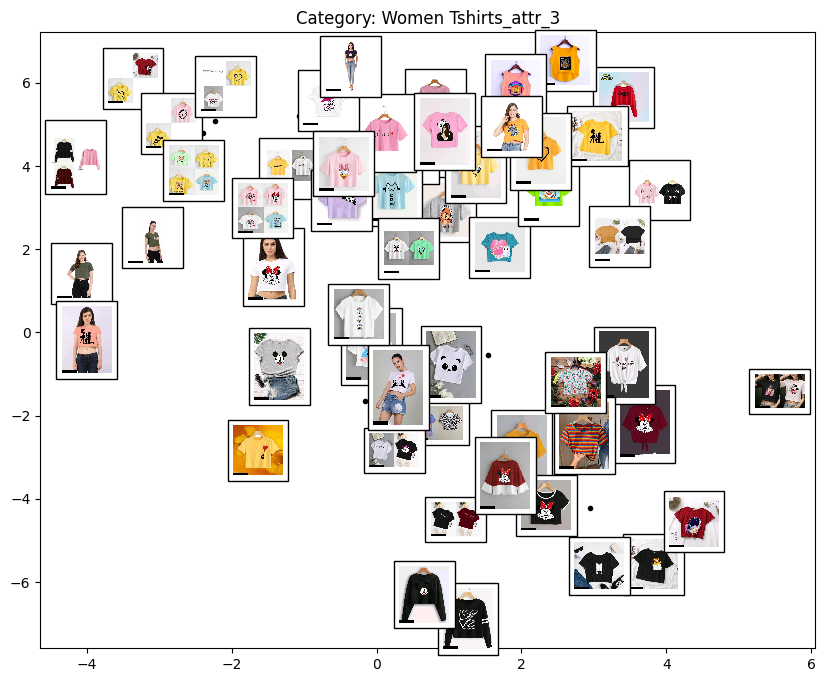

Observations:
- From top to bottom, the clothes gets darker.
- I couldn't find any pattern along the horizontal axis.

## 9. Women's top with black color

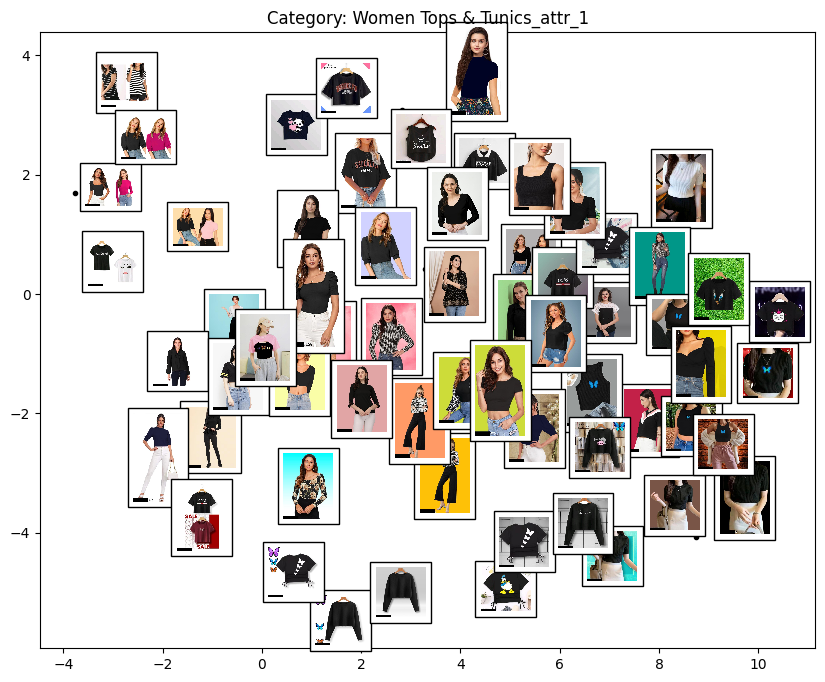


Observations:
- From left to right, the background color of clothes in image gets lighter.
- I couldn't find any pattern in vertical axis.

## 10. Women's tops with crop fit

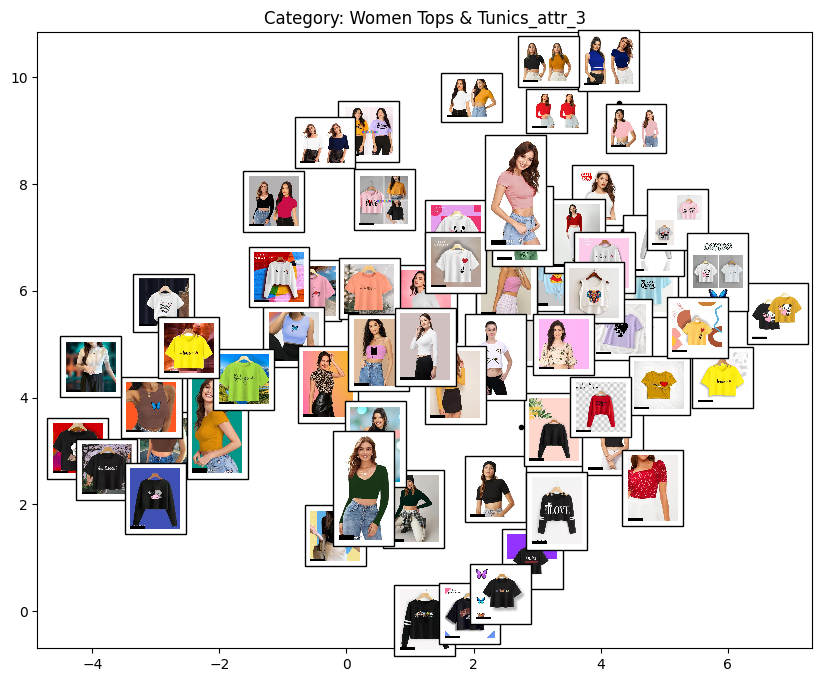


Observations:
- From top to bottom, the darkness of clothes increases.
- From left to right, the background of clothes become lighter.
